# Monocular depth estimation

**Author:** [Victor Basu](https://www.linkedin.com/in/victor-basu-520958147)<br>
**Date created:** 2021/08/30<br>
**Last modified:** 2021/08/30<br>
**Description:** Implement a depth estimation model with a convnet.

## Introduction

_Depth estimation_ is a crucial step towards inferring scene geometry from 2D images.
The goal in _monocular depth estimation_ is to predict the depth value of each pixel or
inferring depth information, given only a single RGB image as input.
This example will show an approach to build a depth estimation model with a convnet
and simple loss functions.

![depth](https://paperswithcode.com/media/thumbnails/task/task-0000000605-d9849a91.jpg)

## Setup

In [ ]:
import os
import sys

import tensorflow as tf
from tensorflow.keras import layers

import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt

tf.random.set_seed(123)

## Downloading the dataset

We will be using the dataset **DIODE: A Dense Indoor and Outdoor Depth Dataset**  for this
tutorial. However, we use the validation set generating training and evaluation subsets
for our model. The reason we use the validation set rather than the training set of the original dataset is because
the training set consists of 81GB of data, which is challenging to download compared
to the validation set which is only 2.6GB.
Other datasets that you could use are
**[NYU-v2](https://cs.nyu.edu/~silberman/datasets/nyu_depth_v2.html)**
and **[KITTI](http://www.cvlibs.net/datasets/kitti/)**.

In [ ]:
annotation_folder = "/dataset/"
if not os.path.exists(os.path.abspath(".") + annotation_folder):
    annotation_zip = tf.keras.utils.get_file(
        "val.tar.gz",
        cache_subdir=os.path.abspath("."),
        origin="http://diode-dataset.s3.amazonaws.com/val.tar.gz",
        extract=True,
    )

2774638592/2774625282 [==============================] - 49s 0us/step


##  Preparing the dataset

We only use the indoor images to train our depth estimation model.

In [ ]:
path = "val"

filelist = []

for root, dirs, files in os.walk(path):
    for file in files:
        filelist.append(os.path.join(root, file))

filelist.sort()
data = {
    "image": [x for x in filelist if x.endswith(".png")],
    "depth": [x for x in filelist if x.endswith("_depth.npy")],
    "mask": [x for x in filelist if x.endswith("_depth_mask.npy")],
}
df = pd.DataFrame(data)

df = df.sample(frac=1, random_state=42)

In [ ]:
path = "/content/License_Plate_Detection_Pytorch/test"

filelist = []

for root, dirs, files in os.walk(path):
    for file in files:
        filelist.append(os.path.join(root, file))

filelist.sort()
data = {
    "image": [x for x in filelist if x.endswith(".jpg")],
    # "depth": [x for x in filelist if x.endswith(".jpg")],
    # "mask": [x for x in filelist if x.endswith(".jpg")],
}
print(data)
df = pd.DataFrame(data)

df = df.sample(frac=1, random_state=42)

In [ ]:
df

,image,depth,mask
284,val/outdoor/scene_00023/scan_00198/00023_00198...,val/outdoor/scene_00023/scan_00198/00023_00198...,val/outdoor/scene_00023/scan_00198/00023_00198...
358,val/outdoor/scene_00023/scan_00200/00023_00200...,val/outdoor/scene_00023/scan_00200/00023_00200...,val/outdoor/scene_00023/scan_00200/00023_00200...
117,val/outdoor/scene_00022/scan_00195/00022_00195...,val/outdoor/scene_00022/scan_00195/00022_00195...,val/outdoor/scene_00022/scan_00195/00022_00195...
423,val/outdoor/scene_00024/scan_00202/00024_00202...,val/outdoor/scene_00024/scan_00202/00024_00202...,val/outdoor/scene_00024/scan_00202/00024_00202...
70,val/outdoor/scene_00022/scan_00194/00022_00194...,val/outdoor/scene_00022/scan_00194/00022_00194...,val/outdoor/scene_00022/scan_00194/00022_00194...
...,...,...,...
106,val/outdoor/scene_00022/scan_00195/00022_00195...,val/outdoor/scene_00022/scan_00195/00022_00195...,val/outdoor/scene_00022/scan_00195/00022_00195...
270,val/outdoor/scene_00023/scan_00198/00023_00198...,val/outdoor/scene_00023/scan_00198/00023_00198...,val/outdoor/scene_00023/scan_00198/00023_00198...
348,val/outdoor/scene_00023/scan_00200/00023_00200...,val/outdoor/scene_00023/scan_00200/00023_00200...,val/outdoor/scene_00023/scan_00200/00023_00200...
435,val/outdoor/scene_00024/scan_00202/00024_00202...,val/outdoor/scene_00024/scan_00202/00024_00202...,val/outdoor/scene_00024/scan_00202/00024_00202...


## Preparing hyperparameters

In [ ]:
HEIGHT = 256
WIDTH = 256
LR = 0.0002
EPOCHS = 100
BATCH_SIZE = 64

## Building a data pipeline

1. The pipeline takes a dataframe containing the path for the RGB images,
as well as the depth and depth mask files.
2. It reads and resize the RGB images.
3. It reads the depth and depth mask files, process them to generate the depth map image and
resize it.
4. It returns the RGB images and the depth map images for a batch.

In [ ]:

class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, data, batch_size=6, dim=(768, 1024), n_channels=3, shuffle=True):
        """
        Initialization
        """
        self.data = data
        self.indices = self.data.index.tolist()
        self.dim = dim
        self.n_channels = n_channels
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.min_depth = 0.1
        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.data) / self.batch_size))

    def __getitem__(self, index):
        if (index + 1) * self.batch_size > len(self.indices):
            self.batch_size = len(self.indices) - index * self.batch_size
        # Generate one batch of data
        # Generate indices of the batch
        index = self.indices[index * self.batch_size : (index + 1) * self.batch_size]
        # Find list of IDs
        batch = [self.indices[k] for k in index]
        x, y = self.data_generation(batch)

        return x, y

    def on_epoch_end(self):

        """
        Updates indexes after each epoch
        """
        self.index = np.arange(len(self.indices))
        if self.shuffle == True:
            np.random.shuffle(self.index)

    def load(self, image_path, depth_map, mask):
        """Load input and target image."""

        image_ = cv2.imread(image_path)
        image_ = cv2.cvtColor(image_, cv2.COLOR_BGR2RGB)
        image_ = cv2.resize(image_, self.dim)
        image_ = tf.image.convert_image_dtype(image_, tf.float32)

        depth_map = np.load(depth_map).squeeze()

        mask = np.load(mask)
        mask = mask > 0

        max_depth = min(300, np.percentile(depth_map, 99))
        depth_map = np.clip(depth_map, self.min_depth, max_depth)
        depth_map = np.log(depth_map, where=mask)

        depth_map = np.ma.masked_where(~mask, depth_map)

        depth_map = np.clip(depth_map, 0.1, np.log(max_depth))
        depth_map = cv2.resize(depth_map, self.dim)
        depth_map = np.expand_dims(depth_map, axis=2)
        depth_map = tf.image.convert_image_dtype(depth_map, tf.float32)

        return image_, depth_map

    def data_generation(self, batch):

        x = np.empty((self.batch_size, *self.dim, self.n_channels))
        y = np.empty((self.batch_size, *self.dim, 1))

        for i, batch_id in enumerate(batch):
            x[i,], y[i,] = self.load(
                self.data["image"][batch_id],
                self.data["depth"][batch_id],
                self.data["mask"][batch_id],
            )

        return x, y


## Visualizing samples

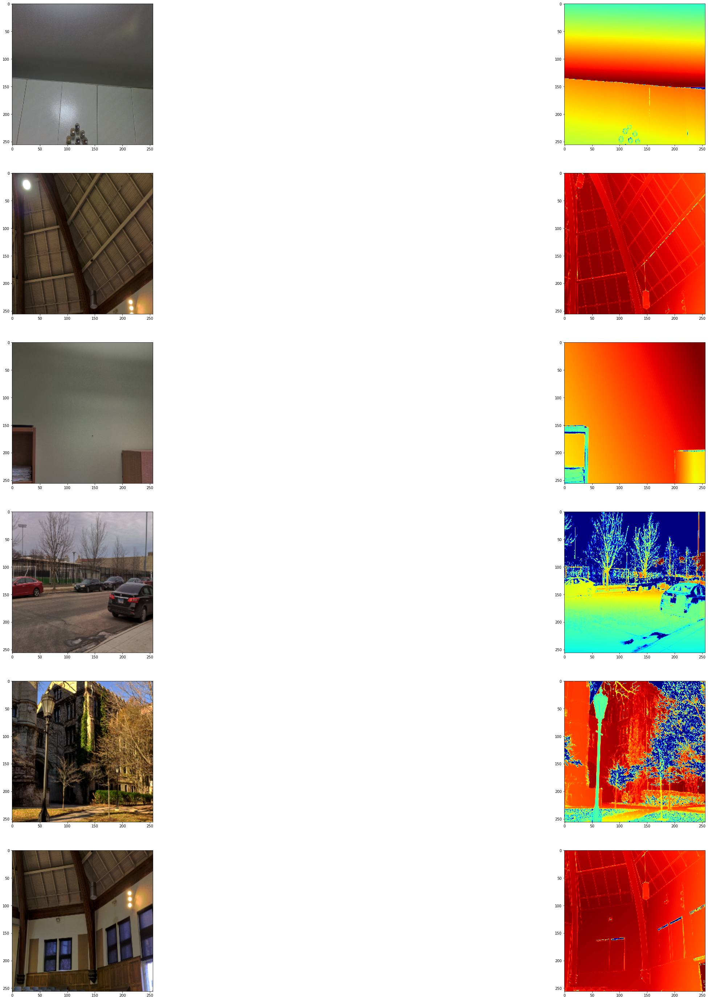

In [ ]:

def visualize_depth_map(samples, test=False, model=None):
    input, target = samples
    cmap = plt.cm.jet
    cmap.set_bad(color="black")

    if test:
        pred = model.predict(input)
        fig, ax = plt.subplots(6, 3, figsize=(50, 50))
        for i in range(6):
            ax[i, 0].imshow((input[i].squeeze()))
            ax[i, 1].imshow((target[i].squeeze()), cmap=cmap)
            ax[i, 2].imshow((pred[i].squeeze()), cmap=cmap)

    else:
        fig, ax = plt.subplots(6, 2, figsize=(50, 50))
        for i in range(6):
            ax[i, 0].imshow((input[i].squeeze()))
            ax[i, 1].imshow((target[i].squeeze()), cmap=cmap)


visualize_samples = next(
    iter(DataGenerator(data=df, batch_size=6, dim=(HEIGHT, WIDTH)))
)
visualize_depth_map(visualize_samples)

## 3D point cloud visualization

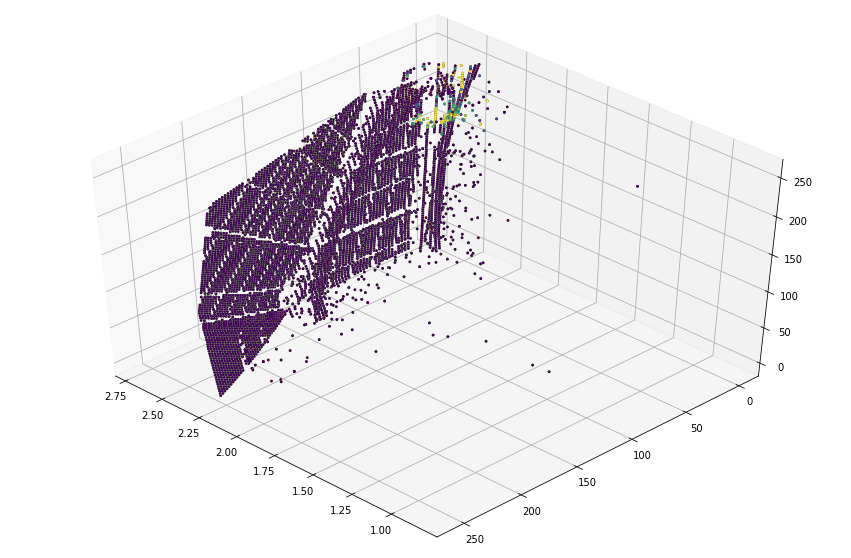

In [ ]:
depth_vis = np.flipud(visualize_samples[1][1].squeeze())  # target
img_vis = np.flipud(visualize_samples[0][1].squeeze())  # input

fig = plt.figure(figsize=(15, 10))
ax = plt.axes(projection="3d")

STEP = 3
for x in range(0, img_vis.shape[0], STEP):
    for y in range(0, img_vis.shape[1], STEP):
        ax.scatter(
            [depth_vis[x, y]] * 3,
            [y] * 3,
            [x] * 3,
            c=tuple(img_vis[x, y, :3] / 255),
            s=3,
        )
    ax.view_init(45, 135)

## Building the model

1. The basic model is from U-Net.
2. Addditive skip-connections are implemented in the downscaling block.

In [ ]:

class DownscaleBlock(layers.Layer):
    def __init__(
        self, filters, kernel_size=(3, 3), padding="same", strides=1, **kwargs
    ):
        super().__init__(**kwargs)
        self.convA = layers.Conv2D(filters, kernel_size, strides, padding)
        self.convB = layers.Conv2D(filters, kernel_size, strides, padding)
        self.reluA = layers.LeakyReLU(alpha=0.2)
        self.reluB = layers.LeakyReLU(alpha=0.2)
        self.bn2a = tf.keras.layers.BatchNormalization()
        self.bn2b = tf.keras.layers.BatchNormalization()

        self.pool = layers.MaxPool2D((2, 2), (2, 2))

    def call(self, input_tensor):
        d = self.convA(input_tensor)
        x = self.bn2a(d)
        x = self.reluA(x)

        x = self.convB(x)
        x = self.bn2b(x)
        x = self.reluB(x)

        x += d
        p = self.pool(x)
        return x, p


class UpscaleBlock(layers.Layer):
    def __init__(
        self, filters, kernel_size=(3, 3), padding="same", strides=1, **kwargs
    ):
        super().__init__(**kwargs)
        self.us = layers.UpSampling2D((2, 2))
        self.convA = layers.Conv2D(filters, kernel_size, strides, padding)
        self.convB = layers.Conv2D(filters, kernel_size, strides, padding)
        self.reluA = layers.LeakyReLU(alpha=0.2)
        self.reluB = layers.LeakyReLU(alpha=0.2)
        self.bn2a = tf.keras.layers.BatchNormalization()
        self.bn2b = tf.keras.layers.BatchNormalization()
        self.conc = layers.Concatenate()

    def call(self, x, skip):
        x = self.us(x)
        concat = self.conc([x, skip])
        x = self.convA(concat)
        x = self.bn2a(x)
        x = self.reluA(x)

        x = self.convB(x)
        x = self.bn2b(x)
        x = self.reluB(x)

        return x


class BottleNeckBlock(layers.Layer):
    def __init__(
        self, filters, kernel_size=(3, 3), padding="same", strides=1, **kwargs
    ):
        super().__init__(**kwargs)
        self.convA = layers.Conv2D(filters, kernel_size, strides, padding)
        self.convB = layers.Conv2D(filters, kernel_size, strides, padding)
        self.reluA = layers.LeakyReLU(alpha=0.2)
        self.reluB = layers.LeakyReLU(alpha=0.2)

    def call(self, x):
        x = self.convA(x)
        x = self.reluA(x)
        x = self.convB(x)
        x = self.reluB(x)
        return x


## Defining the loss

We will optimize 3 losses in our mode.
1. Structural similarity index(SSIM).
2. L1-loss, or Point-wise depth in our case.
3. Depth smoothness loss.

Out of the three loss functions, SSIM contributes the most to improving model performance.

In [ ]:

class DepthEstimationModel(tf.keras.Model):
    def __init__(self):
        super().__init__()
        self.ssim_loss_weight = 0.85
        self.l1_loss_weight = 0.1
        self.edge_loss_weight = 0.9
        self.loss_metric = tf.keras.metrics.Mean(name="loss")
        f = [16, 32, 64, 128, 256]
        self.downscale_blocks = [
            DownscaleBlock(f[0]),
            DownscaleBlock(f[1]),
            DownscaleBlock(f[2]),
            DownscaleBlock(f[3]),
        ]
        self.bottle_neck_block = BottleNeckBlock(f[4])
        self.upscale_blocks = [
            UpscaleBlock(f[3]),
            UpscaleBlock(f[2]),
            UpscaleBlock(f[1]),
            UpscaleBlock(f[0]),
        ]
        self.conv_layer = layers.Conv2D(1, (1, 1), padding="same", activation="tanh")

    def calculate_loss(self, target, pred):
        # Edges
        dy_true, dx_true = tf.image.image_gradients(target)
        dy_pred, dx_pred = tf.image.image_gradients(pred)
        weights_x = tf.exp(tf.reduce_mean(tf.abs(dx_true)))
        weights_y = tf.exp(tf.reduce_mean(tf.abs(dy_true)))

        # Depth smoothness
        smoothness_x = dx_pred * weights_x
        smoothness_y = dy_pred * weights_y

        depth_smoothness_loss = tf.reduce_mean(abs(smoothness_x)) + tf.reduce_mean(
            abs(smoothness_y)
        )

        # Structural similarity (SSIM) index
        ssim_loss = tf.reduce_mean(
            1
            - tf.image.ssim(
                target, pred, max_val=WIDTH, filter_size=7, k1=0.01 ** 2, k2=0.03 ** 2
            )
        )
        # Point-wise depth
        l1_loss = tf.reduce_mean(tf.abs(target - pred))

        loss = (
            (self.ssim_loss_weight * ssim_loss)
            + (self.l1_loss_weight * l1_loss)
            + (self.edge_loss_weight * depth_smoothness_loss)
        )
        print(weights_x)
        print(weights_y)

        return loss

    @property
    def metrics(self):
        return [self.loss_metric]

    def train_step(self, batch_data):
        input, target = batch_data
        with tf.GradientTape() as tape:
            pred = self(input, training=True)
            loss = self.calculate_loss(target, pred)

        gradients = tape.gradient(loss, self.trainable_variables)
        self.optimizer.apply_gradients(zip(gradients, self.trainable_variables))
        self.loss_metric.update_state(loss)
        return {
            "loss": self.loss_metric.result(),
        }

    def test_step(self, batch_data):
        input, target = batch_data

        pred = self(input, training=False)
        loss = self.calculate_loss(target, pred)

        self.loss_metric.update_state(loss)
        return {
            "loss": self.loss_metric.result(),
        }

    def call(self, x):
        c1, p1 = self.downscale_blocks[0](x)
        c2, p2 = self.downscale_blocks[1](p1)
        c3, p3 = self.downscale_blocks[2](p2)
        c4, p4 = self.downscale_blocks[3](p3)


        bn = self.bottle_neck_block(p4)

        u1 = self.upscale_blocks[0](bn, c4)
        u2 = self.upscale_blocks[1](u1, c3)
        u3 = self.upscale_blocks[2](u2, c2)
        u4 = self.upscale_blocks[3](u3, c1)

        return self.conv_layer(u4)


## Model training

In [ ]:
optimizer = tf.keras.optimizers.Adam(
    learning_rate=LR,
    amsgrad=False,
)
model = DepthEstimationModel()
# Define the loss function
cross_entropy = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction="none"
)
# Compile the model
model.compile(optimizer)

train_loader = DataGenerator(
    data=df[:380].reset_index(drop="true"), batch_size=BATCH_SIZE, dim=(HEIGHT, WIDTH)
)
validation_loader = DataGenerator(
    data=df[380:].reset_index(drop="true"), batch_size=BATCH_SIZE, dim=(HEIGHT, WIDTH)
)
results = model.fit(
    train_loader,
    epochs=EPOCHS,
    validation_data=validation_loader,
)

Epoch 1/100
Tensor("Exp:0", shape=(), dtype=float32)
Tensor("Exp_1:0", shape=(), dtype=float32)
Tensor("Exp:0", shape=(), dtype=float32)
Tensor("Exp_1:0", shape=(), dtype=float32)
6/6 [==============================] - ETA: 0s - loss: 1.3070Tensor("Exp:0", shape=(), dtype=float32)
Tensor("Exp_1:0", shape=(), dtype=float32)
6/6 [==============================] - 95s 15s/step - loss: 1.3070 - val_loss: 1.2587
Epoch 2/100
6/6 [==============================] - 42s 7s/step - loss: 0.9566 - val_loss: 1.1399
Epoch 3/100
6/6 [==============================] - 13s 2s/step - loss: 0.8620 - val_loss: nan
Epoch 4/100
6/6 [==============================] - 15s 3s/step - loss: 0.7765 - val_loss: 0.9161
Epoch 5/100
6/6 [==============================] - 12s 2s/step - loss: 0.7521 - val_loss: 0.9367
Epoch 6/100
6/6 [==============================] - 15s 3s/step - loss: 0.7445 - val_loss: 0.8490
Epoch 7/100
6/6 [==============================] - 12s 2s/step - loss: 0.6800 - val_loss: nan
Epoch 8/100
6

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline 

train_loss = results.history['loss']
val_loss = results.history['val_loss']
plt.subplots(figsize = (20, 20))
plt.subplot(4, 2, 1)
plt.semilogy(train_loss)
plt.semilogy(val_loss)
plt.title('Loss during training')
plt.legend(['training loss', 'validation loss'])
plt.xlabel('epochs')
plt.ylabel('CCE')

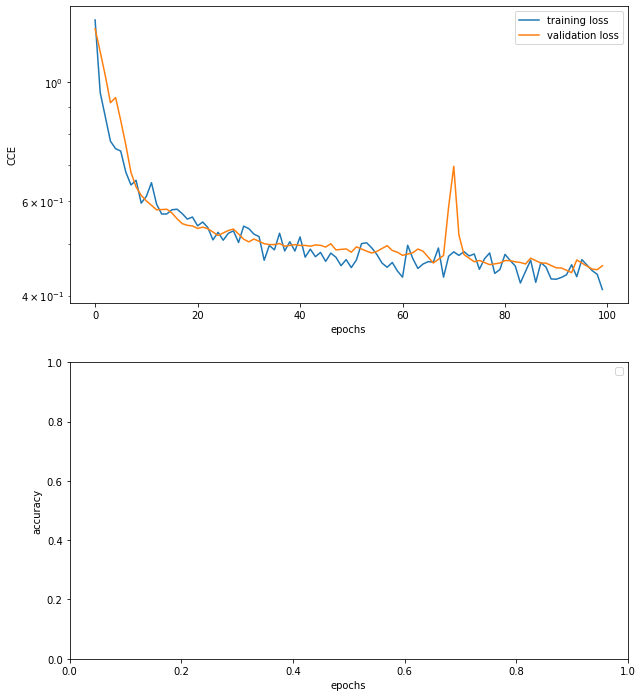

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline 

# results = H

train_loss = results.history['loss']
val_loss = results.history['val_loss']


plt.subplots(figsize = (10, 12))
plt.subplot(2, 1, 1)
plt.semilogy(train_loss)
plt.semilogy(val_loss)

plt.legend(['training loss', 'validation loss'])
plt.xlabel('epochs')
plt.ylabel('CCE')

plt.subplot(2, 1, 2)
# plt.plot(train_acc)
# plt.plot(val_acc)

plt.legend(['training accuracy', 'validation accuracy'])
plt.xlabel('epochs')
plt.ylabel('accuracy')

plt.savefig('Final_Plot.png', dpi=300, transparent=False, bbox_inches='tight')


plt.show()



In [ ]:

for i in range(0,len(val_loss)):
    # print(i)
    if np.isnan(val_loss[i]):
        val_loss[i] = (val_loss[i-1] + val_loss[i+7])/2

In [ ]:
val_loss

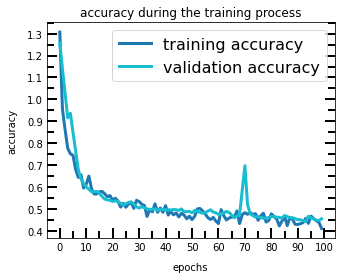

In [ ]:
# Import required packages
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
from pylab import cm

# Generate 2 colors from the 'Set1' colormap
colors = cm.get_cmap('tab10', 2)

# Create figure object and store it in a variable called 'fig'
fig = plt.figure(figsize=(4, 3))

# Add axes object to our figure that takes up entire figure
ax = fig.add_axes([0, 0, 1, 1])

# Create new axes object by cloning the y-axis of the first plot
# ax2 = ax.twiny()

# Edit the major and minor ticks of the x and y axes
ax.xaxis.set_tick_params(which='major', size=10, width=2, direction='in')
ax.xaxis.set_tick_params(which='minor', size=7, width=2, direction='in')
ax.yaxis.set_tick_params(which='major', size=10, width=2, direction='in', right='on')
ax.yaxis.set_tick_params(which='minor', size=7, width=2, direction='in', right='on')

# Edit the tick parameters of the energy x-axis
# ax2.xaxis.set_tick_params(which='major', size=10, width=2, direction='in')
# ax2.xaxis.set_tick_params(which='minor', size=7, width=2, direction='in')

# Plot the two sample absorbances, using previously generated colors
ax.plot(train_loss, linewidth=3, color=colors(0), label='training accuracy')
ax.plot(val_loss, linewidth=3, color=colors(1), label='validation accuracy')


# Edit the major and minor tick locations of x and y axes
ax.xaxis.set_major_locator(mpl.ticker.MultipleLocator(10))
ax.xaxis.set_minor_locator(mpl.ticker.MultipleLocator(5))
ax.yaxis.set_major_locator(mpl.ticker.MultipleLocator(0.1))
ax.yaxis.set_minor_locator(mpl.ticker.MultipleLocator(0.05))

# Add ticks manually to energy axis
# ax2.xaxis.set_major_locator(mpl.ticker.FixedLocator(E_to_WL(np.linspace(1.5, 3.0, 4))))
# ax2.xaxis.set_minor_locator(mpl.ticker.FixedLocator(E_to_WL(np.linspace(1.4, 3.2, 19))))

# Add tick labels manually to energy axis
# ax2.set_xticklabels(['1.5', '2.0', '2.5', '3.0'])

# Add the x and y-axis labels
ax.set_xlabel(r'epochs', labelpad=10)
ax.set_ylabel('accuracy', labelpad=10)

ax.set_title(r'accuracy during the training process')

# Add energy axis label
# ax2.set_xlabel('Energy (eV)', labelpad=10)

# Set the axis limits
# ax.set_xlim(0, 100)
# ax.set_ylim(0.8, 1)

# Set the energy axis limits
# ax2.set_xlim(370, 930)

# Add legend to plot
ax.legend(bbox_to_anchor=(1, 1), loc=1, frameon=True, fontsize=16)

# Save figure
plt.savefig('Final_Plot.png', dpi=300, transparent=False, bbox_inches='tight')

# Show figure
plt.show()

## Visualizing model output

We visualize the model output over the validation set.
The first image is the RGB image, the second image is the ground truth depth map image
and the third one is the predicted depth map image.

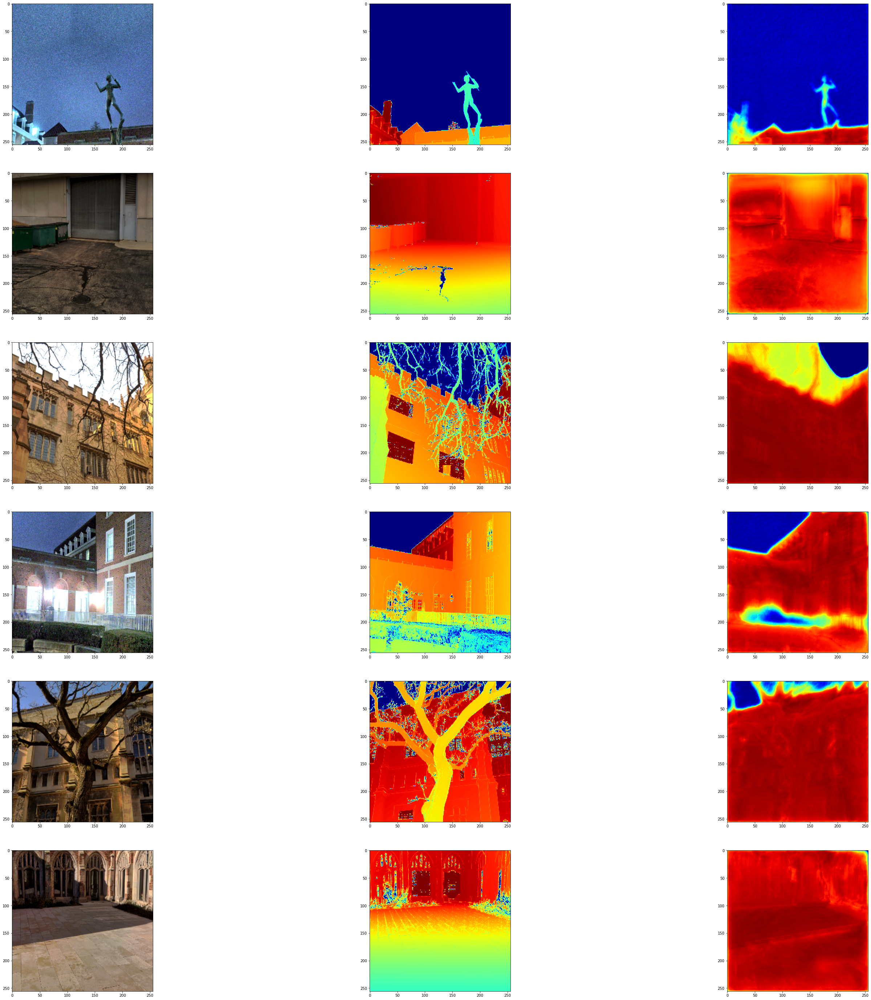

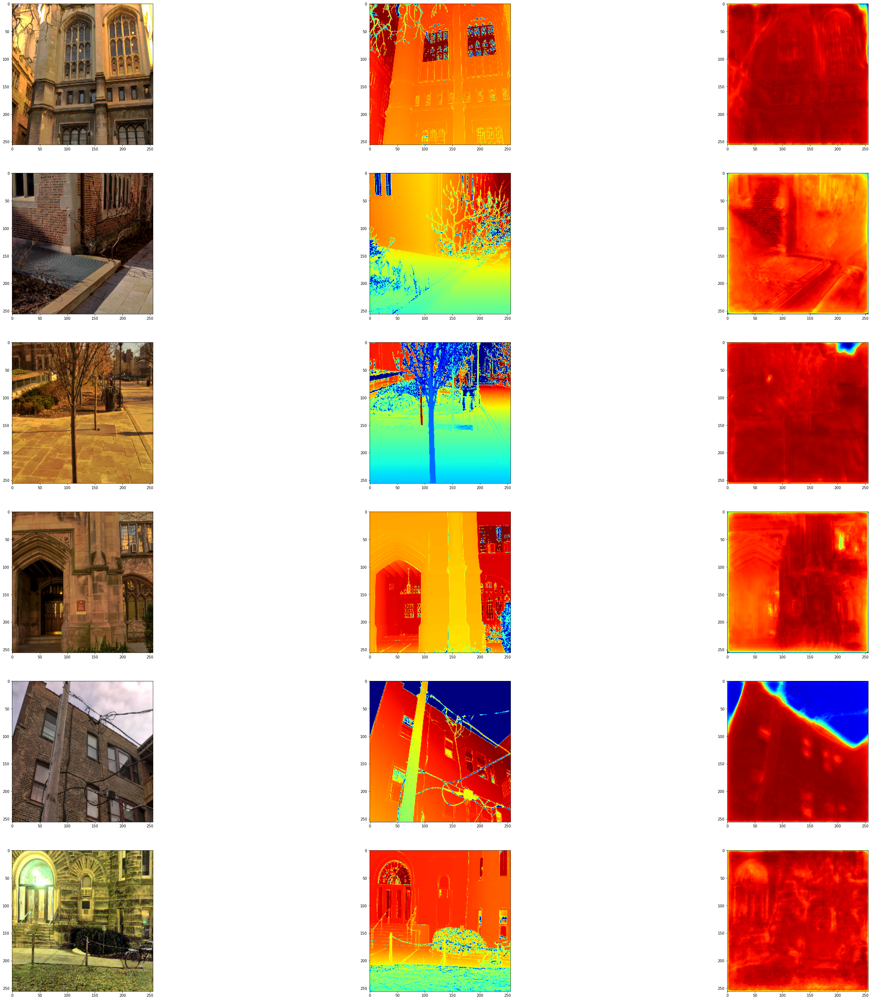

In [ ]:
test_loader = next(
    iter(
        DataGenerator(
            data=df[265:].reset_index(drop="true"), batch_size=6, dim=(HEIGHT, WIDTH)
        )
    )
)
visualize_depth_map(test_loader, test=True, model=model)

test_loader = next(
    iter(
        DataGenerator(
            data=df[300:].reset_index(drop="true"), batch_size=6, dim=(HEIGHT, WIDTH)
        )
    )
)
visualize_depth_map(test_loader, test=True, model=model)

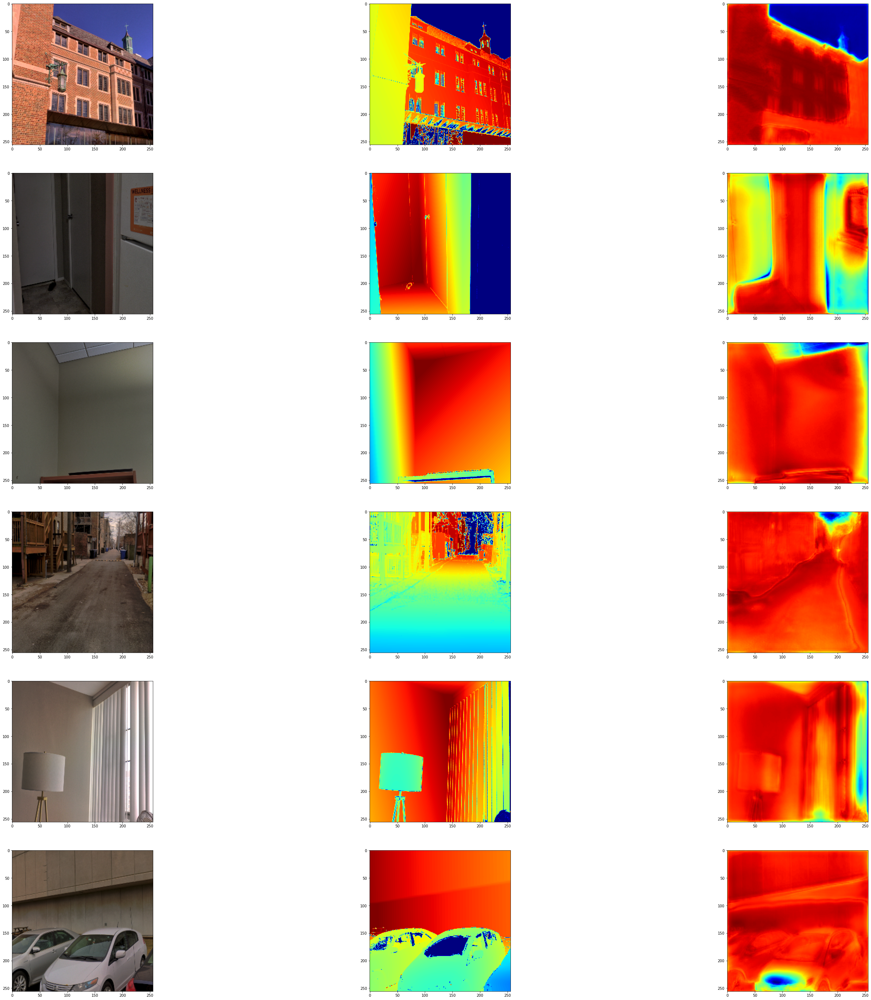

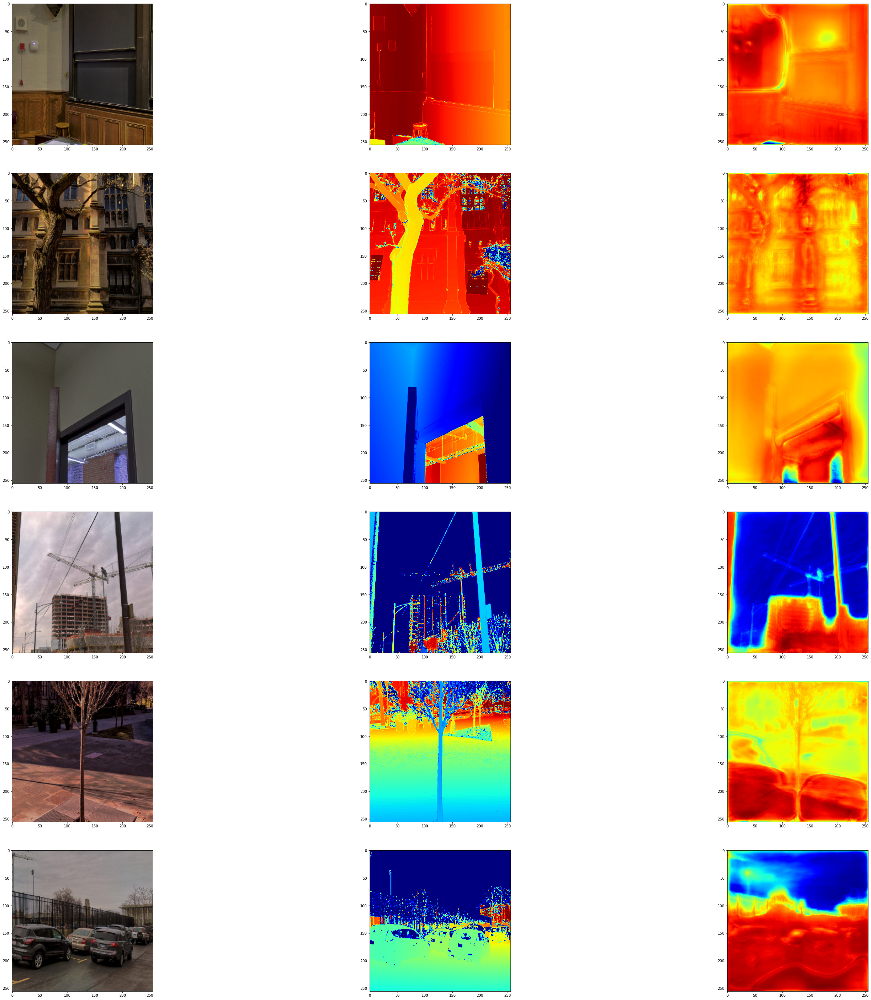

In [ ]:
test_loader = next(
    iter(
        DataGenerator(
            data=df[265:].reset_index(drop="true"), batch_size=6, dim=(HEIGHT, WIDTH)
        )
    )
)
visualize_depth_map(test_loader, test=True, model=model)

test_loader = next(
    iter(
        DataGenerator(
            data=df[300:].reset_index(drop="true"), batch_size=6, dim=(HEIGHT, WIDTH)
        )
    )
)
visualize_depth_map(test_loader, test=True, model=model)

#### create depth dataset

In [ ]:
!git clone https://github.com/xuexingyu24/License_Plate_Detection_Pytorch.git

Cloning into 'License_Plate_Detection_Pytorch'...
remote: Enumerating objects: 90, done.
remote: Total 90 (delta 0), reused 0 (delta 0), pack-reused 90
Unpacking objects: 100% (90/90), done.


In [ ]:
!unzip /content/drive/MyDrive/CCPD2020.zip

In [ ]:
path = "/content/CCPD2020/ccpd_green"

filelist = []

for root, dirs, files in os.walk(path):
    for file in files:
        filelist.append(os.path.join(root, file))

filelist.sort()
data = {
    "image": [x for x in filelist if x.endswith(".jpg")],
    # "depth": [x for x in filelist if x.endswith(".jpg")],
    # "mask": [x for x in filelist if x.endswith(".jpg")],
}
print(data)
df = pd.DataFrame(data)

df = df.sample(frac=1, random_state=42)

In [ ]:
import cv2

dim = (768, 1024)
n_channels = 3
batch_size = 200
allboxes = []

for i in range(0, 15):
    image_path = df["image"][i]
    image_name = image_path.split("/")[-1].replace(".jpg","")

    image_ = cv2.imread(image_path)
    imgheight = image_.shape[0]
    imgwidth = image_.shape[1]
    image_ = cv2.resize(image_, (dim[1],dim[0]))
    image_tf = tf.image.convert_image_dtype(image_, tf.float32)

    x = np.empty((1, *dim, n_channels))
    x[0,] = image_tf


    pred = model.predict(x)

    x_scale = dim[1] / imgwidth
    y_scale = dim[0] / imgheight

    imgname_split = image_name.split('-')
    rec_x1y1 = imgname_split[2].split('_')[0].split('&')
    rec_x2y2 = imgname_split[2].split('_')[1].split('&')  
    x1, y1, x2, y2 = int(rec_x1y1[0]), int(rec_x1y1[1]), int(rec_x2y2[0]), int(rec_x2y2[1])
    
    x = int(np.round(x1 * x_scale))
    y = int(np.round(y1 * y_scale))
    xmax = int(np.round(x2 * x_scale))
    ymax = int(np.round(y2 * y_scale))

    

    boxes = np.zeros((1,4), dtype=np.int32)
    boxes[0,0], boxes[0,1], boxes[0,2], boxes[0,3] = x, y, xmax, ymax

    for box in boxes:
        # box (x_left, y_top, w, h)
        x1, y1, x2, y2 = box
        w = x2 - x1 + 1
        h = y2 - y1 + 1

        # print(image_name)
        # print(imgname_split[2].split('_'))
        # drawBox([[1, 0, x1, y1, x2, y2]], image_)
        
        max(pred[:,:,:,:])
        pred = np.exp(pred)

        mean = np.mean(pred[0,x1:x2,y1:y2,])
        median = np.percentile(pred[0,x1:x2,y1:y2,],50)


        bb = [x1,y1,x2,y2,mean,median]
        allboxes.append(bb)
        
        cv2_imshow(image_)
    

In [ ]:
import csv
header = ["x1", "y1", "x2", "y2", "mean_distance", "median_distance"]
with open('depth_bboxes.csv', 'w', encoding='UTF8', newline='') as f:
        writer = csv.writer(f)

        writer.writerow(header)

        # write the header
        writer.writerows(allboxes)

## Possible improvements

1. You can improve this model by replacing the encoding part of the U-Net with a
pretrained DenseNet or ResNet.
2. Loss functions play an important role in solving this problem.
Tuning the loss functions may yield significant improvement.

## References

The following papers go deeper into possible approaches for depth estimation.
1. [Implement a depth estimation model with a convnet](https://keras.io/examples/vision/depth_estimation/)
2. [Depth Prediction Without the Sensors: Leveraging Structure for Unsupervised Learning from Monocular Videos](https://arxiv.org/pdf/1811.06152v1.pdf)
3. [Digging Into Self-Supervised Monocular Depth Estimation](https://openaccess.thecvf.com/content_ICCV_2019/papers/Godard_Digging_Into_Self-Supervised_Monocular_Depth_Estimation_ICCV_2019_paper.pdf)
4. [Deeper Depth Prediction with Fully Convolutional Residual Networks](https://arxiv.org/pdf/1606.00373v2.pdf)

You can also find helpful implementations in the papers with code depth estimation task.

You can use the trained model hosted on [Hugging Face Hub](https://huggingface.co/spaces/keras-io/Monocular-Depth-Estimation) and try the demo on [Hugging Face Spaces](https://huggingface.co/keras-io/monocular-depth-estimation).